# Juego de la Vida


##### CRUZ

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap
from scipy.signal import convolve2d
from IPython.display import HTML

# 1.Parámetros
N = 30
GEMS = 100
P = 0.40
GROSOR = N // 3  # Grosor 10

# 2. Creación de la Máscara y el Tablero
# mask: True donde es cruz (zona de juego), False donde es muro
inicio = (N - GROSOR) // 2
fin = inicio + GROSOR

mask = np.zeros((N, N), dtype=bool)
mask[inicio:fin, :] = True
mask[:, inicio:fin] = True

# Estado inicial Bernoulli(p) solo dentro de la cruz
grid = np.zeros((N, N), dtype=int)
grid[mask] = np.random.choice([1, 0], size=np.sum(mask), p=[P, 1-P])

# Kernel para contar vecinos
kernel = np.array([[1, 1, 1], [1, 0, 1], [1, 1, 1]])

# 3. Lógica de Evolución
def update(frameNum, img, grid, title):
    # Convolución para contar vecinos
    num_vecinos = convolve2d(grid, kernel, mode='same', boundary='fill', fillvalue=0)
    
    # Reglas de Conway
    sobrevive = (grid == 1) & ((num_vecinos == 2) | (num_vecinos == 3))
    nace = (grid == 0) & (num_vecinos == 3)
    
    # Aplicar cambios Y restringir a la cruz (muro actúa como vacío)
    grid[:] = ((sobrevive | nace) & mask).astype(int)
    
    # Crear matriz de visualización: -1 para el muro, 0 muerta, 1 viva
    # Esto permite asignar colores distintos en el colormap
    vis_grid = grid.copy().astype(float)
    vis_grid[~mask] = -1  # Pintamos el muro fuera de la máscara
    
    img.set_data(vis_grid)
    title.set_text(f"Juego de la Vida en Cruz - t = {frameNum}")
    return img, title

# 4. Configuración Estética
# -1: Gris Oscuro (#4D4D4D), 0: Blanco (#FFFFFF), 1: Negro (#000000)
cmap_cruz = ListedColormap(['#4D4D4D', '#FFFFFF', '#000000'])

fig, ax = plt.subplots(figsize=(8, 8))
# Inicializamos visualización
vis_inicial = grid.copy().astype(float)
vis_inicial[~mask] = -1
img = ax.imshow(vis_inicial, interpolation='nearest', cmap=cmap_cruz, 
                origin='lower', extent=[0, N, 0, N], vmin=-1, vmax=1)


ax.set_xticks(np.arange(0, N + 1, 1))
ax.set_yticks(np.arange(0, N + 1, 1))
ax.grid(which='both', color='gray', linestyle='-', linewidth=0.5)
ax.set_xlabel('Eje X')
ax.set_ylabel('Eje Y')
title = ax.set_title("Evolución Juego de la Vida - t = 0")

# 5. Animación y Guardado
ani = animation.FuncAnimation(fig, update, fargs=(img, grid, title),
                              frames=GEMS + 1, interval=150, blit=True)

ani.save('juego_vida_muro_gris.gif', writer='pillow')
plt.close()

HTML(ani.to_jshtml())

##### Circunferencia 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap
from scipy.signal import convolve2d
from IPython.display import HTML

# 1.Parámetros
N = 30
GEMS = 100
P = 0.2
RADIO = N / 2  # Radio de 15 para que quepa en la cuadrícula de 30x30

# 2. Creación de la Máscara Circular
# Calculamos la distancia de cada celda al centro (15, 15)
y, x = np.ogrid[0:N, 0:N]
centro_x, centro_y = (N-1)/2, (N-1)/2
distancia_al_centro = np.sqrt((x - centro_x)**2 + (y - centro_y)**2)

# La máscara es True solo dentro del radio
mask = distancia_al_centro <= RADIO

# Estado inicial Bernoulli(p) solo dentro del círculo
grid = np.zeros((N, N), dtype=int)
grid[mask] = np.random.choice([1, 0], size=np.sum(mask), p=[P, 1-P])

# Kernel de Moore
kernel = np.array([[1, 1, 1], [1, 0, 1], [1, 1, 1]])

# 3. Lógica de Evolución
def update(frameNum, img, grid, title):
    # Convolución para contar vecinos
    num_vecinos = convolve2d(grid, kernel, mode='same', boundary='fill', fillvalue=0)
    
    # Reglas de Conway
    sobrevive = (grid == 1) & ((num_vecinos == 2) | (num_vecinos == 3))
    nace = (grid == 0) & (num_vecinos == 3)
    
    # Aplicar evolución y restringir al círculo (el muro gris es infranqueable)
    grid[:] = ((sobrevive | nace) & mask).astype(int)
    
    # Matriz de visualización: -1: Muro, 0: Muerta, 1: Viva
    vis_grid = grid.copy().astype(float)
    vis_grid[~mask] = -1  
    
    img.set_data(vis_grid)
    title.set_text(f"Juego de la Vida (Circunferencia) - t = {frameNum}")
    return img, title

# 4. Estética y Colormap (Gris Oscuro, Blanco, Negro)
cmap_circular = ListedColormap(['#4D4D4D', '#FFFFFF', '#000000'])

fig, ax = plt.subplots(figsize=(8, 8))
vis_inicial = grid.copy().astype(float)
vis_inicial[~mask] = -1
img = ax.imshow(vis_inicial, interpolation='nearest', cmap=cmap_circular, 
                origin='lower', extent=[0, N, 0, N], vmin=-1, vmax=1)


ax.set_xticks(np.arange(0, N + 1, 1))
ax.set_yticks(np.arange(0, N + 1, 1))
ax.grid(which='both', color='gray', linestyle='-', linewidth=0.5)
ax.set_xlabel('Eje X')
ax.set_ylabel('Eje Y')
title = ax.set_title("Evolución en Área Circular - t = 0")

# 5. Animación
ani = animation.FuncAnimation(fig, update, fargs=(img, grid, title),
                              frames=GEMS + 1, interval=150, blit=True)

ani.save('juego_vida_circular.gif', writer='pillow')
plt.close()

HTML(ani.to_jshtml())

##### Cubo


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- 1. CONFIGURACIÓN ---
N = 10
P_BERNOULLI = 0.25
T_MAX = 50 

# --- 2. LÓGICA DE EVOLUCIÓN ---
def generar_historia(n, p, pasos):
    historia = np.zeros((pasos, n, n, n))
    actual = np.random.choice([0, 1], size=(n, n, n), p=[1-p, p])
    for t in range(pasos):
        historia[t] = actual
        nuevo = np.copy(actual)
        for x in range(n):
            for y in range(n):
                for z in range(n):
                    vecinos = np.sum(actual[max(0, x-1):x+2, 
                                            max(0, y-1):y+2, 
                                            max(0, z-1):z+2]) - actual[x,y,z]
                    if actual[x,y,z] == 1 and (4 <= vecinos <= 5):
                        nuevo[x,y,z] = 1
                    elif actual[x,y,z] == 0 and vecinos == 5:
                        nuevo[x,y,z] = 1
                    else:
                        nuevo[x,y,z] = 0
        actual = nuevo
    return historia

datos = generar_historia(N, P_BERNOULLI, T_MAX)

# --- 3. CREACIÓN DE LA ANIMACIÓN CON MATPLOTLIB ---
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='3d')

def update(frame):
    ax.clear()
    x, y, z = np.where(datos[frame] == 1)
    
    # Dibujamos las células
    scatter = ax.scatter(x, y, z, c=z, cmap='viridis', marker='s', s=80, edgecolors='black')
    
    # Estética del sistema de coordenadas
    ax.set_xlim(-0.5, N-0.5)
    ax.set_ylim(-0.5, N-0.5)
    ax.set_zlim(-0.5, N-0.5)
    ax.set_title(f"Tiempo t = {frame}")
    ax.view_init(elev=20, azim=frame * 4) # Rotación para apreciar la dimensión
    return scatter,

ani = FuncAnimation(fig, update, frames=T_MAX, interval=200, blit=False)

# --- 4. VISUALIZACIÓN DIRECTA EN EL NOTEBOOK ---
# Esto genera el reproductor de Matplotlib dentro del notebook
plt.close() # Evita que Matplotlib muestre la figura estática inicial
HTML(ani.to_jshtml())

## B. Efecto de p para N fijo 


#### Cuadricula 30*30

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 1. Configuración de parámetros
N = 30
P = 0.2  # Probabilidad Bernoulli(p)
GEMS = 100

# Población inicial
grid = np.random.choice([1, 0], size=(N, N), p=[P, 1-P])

# 2. Función de actualización lógica
def update(frameNum, img, grid, N, title):
    new_grid = grid.copy()
    for i in range(N):
        for j in range(N):
            # Cálculo de vecinos (bordes toroidales)
            total = int((grid[i, (j-1)%N] + grid[i, (j+1)%N] +
                         grid[(i-1)%N, j] + grid[(i+1)%N, j] +
                         grid[(i-1)%N, (j-1)%N] + grid[(i-1)%N, (j+1)%N] +
                         grid[(i+1)%N, (j-1)%N] + grid[(i+1)%N, (j+1)%N]))
            
            if grid[i, j] == 1:
                if (total < 2) or (total > 3):
                    new_grid[i, j] = 0
            else:
                if total == 3:
                    new_grid[i, j] = 1

    img.set_data(new_grid)
    grid[:] = new_grid[:]
    title.set_text(f"Evolución Juego de la Vida - t = {frameNum}")
    return img, title

# 3. Configuración de la Visualización (Plano Cartesiano)
fig, ax = plt.subplots(figsize=(8, 8))

# imshow dibuja la matriz. 'origin=lower' coloca el (0,0) abajo a la izquierda (1er cuadrante)
img = ax.imshow(grid, interpolation='nearest', cmap='binary', origin='lower', extent=[0, N, 0, N])

# Configuración de los ejes para que parezca una tabla/plano
ax.set_xticks(np.arange(0, N + 1, 1))
ax.set_yticks(np.arange(0, N + 1, 1))
ax.grid(which='both', color='gray', linestyle='-', linewidth=0.5)

# Etiquetas de los ejes
ax.set_xlabel('Eje X')
ax.set_ylabel('Eje Y')
title = ax.set_title("Evolución Juego de la Vida - t = 0")

# 4. Crear Animación
ani = animation.FuncAnimation(fig, update, fargs=(img, grid, N, title),
                              frames=GEMS + 1,
                              interval=150,
                              blit=True)

# 5. Guardar y Mostrar
ani.save('juego_de_la_vida.gif', writer='pillow')
plt.close() # Evita que se muestre la imagen estática final abajo

# Para visualizar en Jupyter/Colab
HTML(ani.to_jshtml())

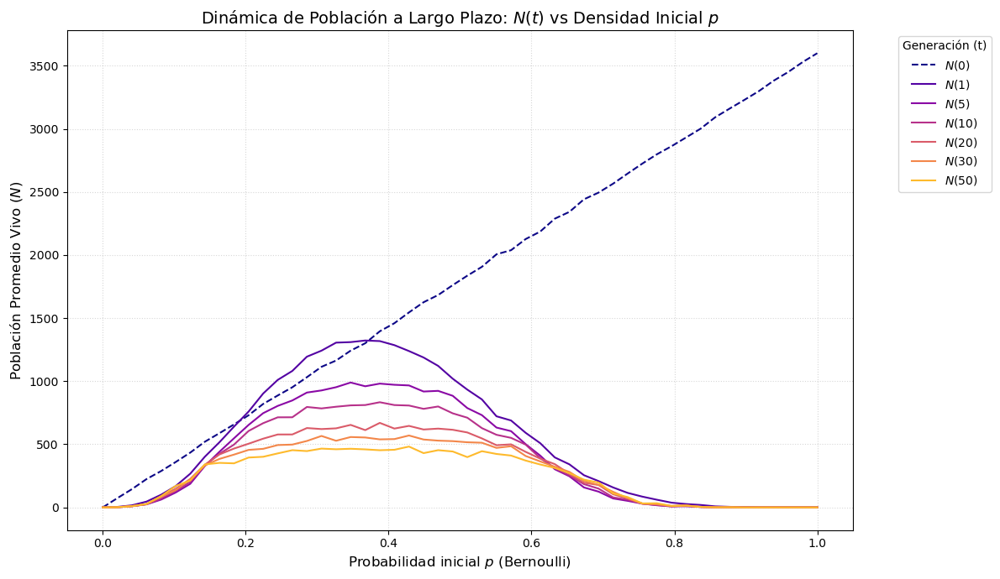

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

def aplicar_reglas(grid):
    """Evolución optimizada con convolución."""
    kernel = np.array([[1, 1, 1], [1, 0, 1], [1, 1, 1]])
    vecinos = convolve2d(grid, kernel, mode='same', boundary='wrap')
    nueva_grid = np.zeros_like(grid)
    # Reglas: Supervivencia (2 o 3) y Nacimiento (3)
    nueva_grid[(grid == 1) & ((vecinos == 2) | (vecinos == 3))] = 1
    nueva_grid[(grid == 0) & (vecinos == 3)] = 1
    return nueva_grid

# 1. Configuración de parámetros
N_SIZE = 60           # Grid ligeramente más grande para mayor estabilidad
P_STEPS = 50          # Resolución del eje X (p)
TRIALS = 10           # Repeticiones para suavizar la curva
GENERACIONES_INTERES = [0, 1, 5, 10, 20, 30, 50]
MAX_GEN = max(GENERACIONES_INTERES)

p_values = np.linspace(0, 1, P_STEPS)
# Estructura para almacenar resultados: {t: [promedios_por_p]}
resultados = {t: [] for t in GENERACIONES_INTERES}

# 2. Simulación
for p in p_values:
    # Acumuladores para promediar los TRIALS de este p
    acumulador_p = {t: [] for t in GENERACIONES_INTERES}
    
    for _ in range(TRIALS):
        grid = (np.random.rand(N_SIZE, N_SIZE) < p).astype(int)
        
        # Evolución temporal
        for t in range(MAX_GEN + 1):
            if t in GENERACIONES_INTERES:
                acumulador_p[t].append(np.sum(grid))
            grid = aplicar_reglas(grid)
    
    # Guardar el promedio de los trials para cada t
    for t in GENERACIONES_INTERES:
        resultados[t].append(np.mean(acumulador_p[t]))

# 3. Gráficas
plt.figure(figsize=(12, 7))
cmap = plt.cm.plasma(np.linspace(0, 0.85, len(GENERACIONES_INTERES)))

for i, t in enumerate(GENERACIONES_INTERES):
    lw = 2.5 if t == 100 else 1.5
    ls = '--' if t == 0 else '-'
    plt.plot(p_values, resultados[t], label=f'$N({t})$', color=cmap[i], lw=lw, linestyle=ls)

plt.title('Dinámica de Población a Largo Plazo: $N(t)$ vs Densidad Inicial $p$', fontsize=14)
plt.xlabel('Probabilidad inicial $p$ (Bernoulli)', fontsize=12)
plt.ylabel('Población Promedio Vivo ($N$)', fontsize=12)
plt.legend(title="Generación (t)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle=':', alpha=0.5)
plt.tight_layout()
plt.show()

#### Cubo 10x10x10

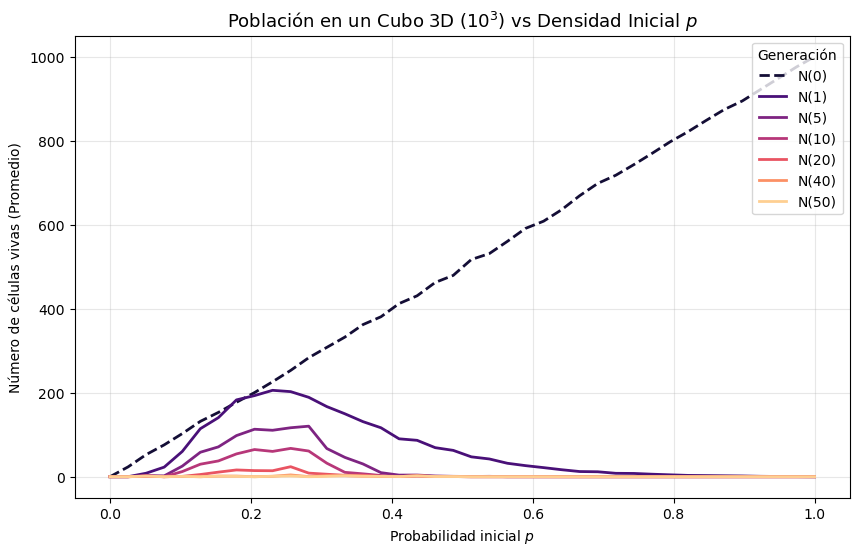

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def simular_pasos_3d(grid, pasos_objetivo):
    """Evoluciona el cubo 3D y devuelve la población en los tiempos deseados."""
    # Kernel 3x3x3 para contar los 26 vecinos
    kernel = np.ones((3, 3, 3))
    kernel[1, 1, 1] = 0
    
    poblaciones = {}
    actual = grid.copy()
    
    max_t = max(pasos_objetivo)
    for t in range(max_t + 1):
        if t in pasos_objetivo:
            poblaciones[t] = np.sum(actual)
        
        # Convolución para contar vecinos (modo constant 0 simula bordes no toroidales)
        vecinos = convolve(actual, kernel, mode='constant', cval=0)
        
        nuevo = np.zeros_like(actual)
        # Aplicar reglas 3D proporcionadas
        # Supervivencia: (4 <= vecinos <= 5)
        nuevo[(actual == 1) & (vecinos >= 4) & (vecinos <= 5)] = 1
        # Nacimiento: (vecinos == 5)
        nuevo[(actual == 0) & (vecinos == 5)] = 1
        
        actual = nuevo
    return poblaciones

# 1. Parámetros
N = 10
P_STEPS = 40
TRIALS = 15
TIEMPOS = [0, 1, 5, 10, 20, 40, 50]

p_values = np.linspace(0, 1, P_STEPS)
resultados = {t: [] for t in TIEMPOS}

# 2. Simulación de Monte Carlo
for p in p_values:
    acumuladores = {t: [] for t in TIEMPOS}
    
    for _ in range(TRIALS):
        # Inicialización iid Bernoulli(p)
        grid_inicial = (np.random.rand(N, N, N) < p).astype(int)
        datos_pob = simular_pasos_3d(grid_inicial, TIEMPOS)
        
        for t in TIEMPOS:
            acumuladores[t].append(datos_pob[t])
            
    for t in TIEMPOS:
        resultados[t].append(np.mean(acumuladores[t]))

# 3. Gráfica de resultados
plt.figure(figsize=(10, 6))
colors = plt.cm.magma(np.linspace(0.1, 0.9, len(TIEMPOS)))

for i, t in enumerate(TIEMPOS):
    estilo = '--' if t == 0 else '-'
    plt.plot(p_values, resultados[t], label=f'N({t})', color=colors[i], lw=2, linestyle=estilo)

plt.title(f'Población en un Cubo 3D ($10^3$) vs Densidad Inicial $p$', fontsize=13)
plt.xlabel('Probabilidad inicial $p$')
plt.ylabel('Número de células vivas (Promedio)')
plt.legend(title="Generación", loc='upper right')
plt.grid(True, alpha=0.3)
plt.show()